In [17]:
import json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# supress warnings
import warnings
warnings.filterwarnings('ignore')

In [18]:
df = pd.read_csv('processed_data.csv')

# Univariate Analysis #

In [19]:
df.describe()

,Id,age,annual_income,monthly_expenses,old_dependents,young_dependents,home_ownership,occupants_count,house_area,sanitary_availability,water_availability,loan_tenure,loan_installments,loan_amount
count,30802.000000,30802.000000,3.080200e+04,30802.000000,30802.000000,30802.000000,30802.000000,30802.000000,30802.000000,30802.000000,30802.000000,30802.000000,30802.000000,3.080200e+04
mean,22502.692845,36.210830,4.677961e+04,3462.521882,0.053503,1.309882,0.977339,3.086488,543.441043,0.773943,0.772109,11.998214,20.903740,9.071414e+03
std,11509.371051,8.934762,2.537728e+04,1342.417050,0.241731,1.060232,0.148822,1.253541,383.350352,0.418283,0.254569,1.321809,16.182558,1.424537e+04
min,1.000000,18.000000,3.000000e+03,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,3.000000,0.000000,1.000000e+02
25%,15334.500000,29.000000,3.000000e+04,2500.000000,0.000000,0.000000,1.000000,2.000000,300.000000,1.000000,0.500000,12.000000,12.000000,7.000000e+03
50%,23921.500000,36.000000,4.800000e+04,3500.000000,0.000000,1.000000,1.000000,3.000000,500.000000,1.000000,1.000000,12.000000,12.000000,8.000000e+03
75%,32146.750000,42.000000,6.000000e+04,4000.000000,0.000000,2.000000,1.000000,4.000000,700.000000,1.000000,1.000000,12.000000,12.000000,1.000000e+04
max,40000.000000,88.000000,1.200000e+06,16000.000000,3.000000,7.000000,1.000000,15.000000,1900.000000,1.000000,1.000000,84.000000,84.000000,1.343000e+06


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30802 entries, 0 to 30801
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Id                     30802 non-null  int64  
 1   city                   30802 non-null  object 
 2   age                    30802 non-null  int64  
 3   sex                    30802 non-null  object 
 4   social_class           30802 non-null  object 
 5   primary_business       30802 non-null  object 
 6   secondary_business     30802 non-null  object 
 7   annual_income          30802 non-null  float64
 8   monthly_expenses       30802 non-null  float64
 9   old_dependents         30802 non-null  int64  
 10  young_dependents       30802 non-null  int64  
 11  home_ownership         30802 non-null  float64
 12  type_of_house          30802 non-null  object 
 13  occupants_count        30802 non-null  int64  
 14  house_area             30802 non-null  float64
 15  sa

In [21]:
# Checking our data cleaning results
df.isnull().sum()

Id                       0
city                     0
age                      0
sex                      0
social_class             0
primary_business         0
secondary_business       0
annual_income            0
monthly_expenses         0
old_dependents           0
young_dependents         0
home_ownership           0
type_of_house            0
occupants_count          0
house_area               0
sanitary_availability    0
water_availability       0
loan_purpose             0
loan_tenure              0
loan_installments        0
loan_amount              0
dtype: int64

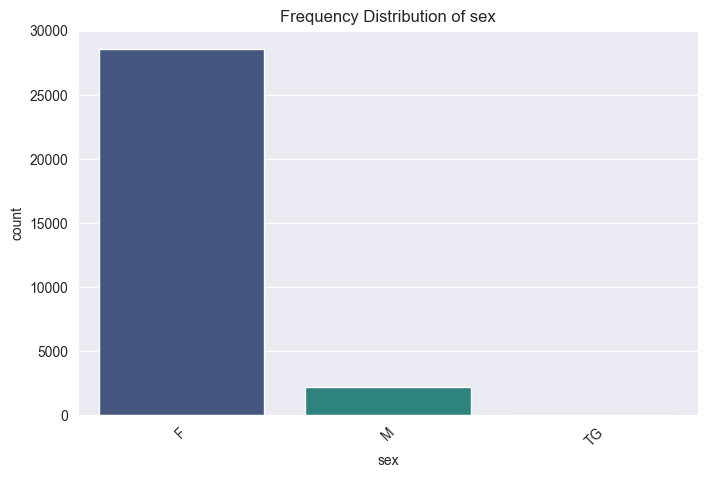

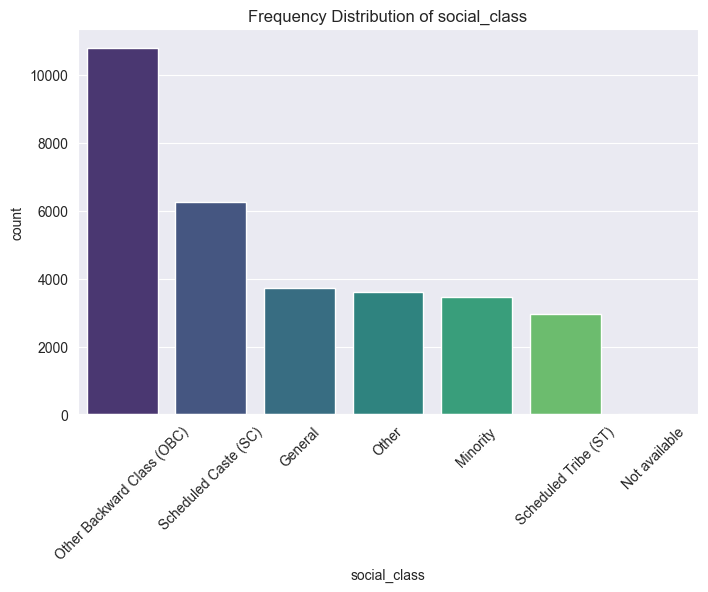

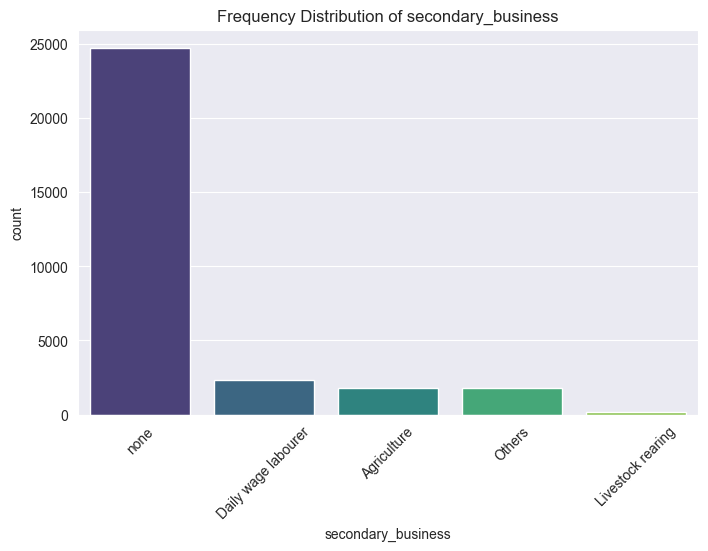

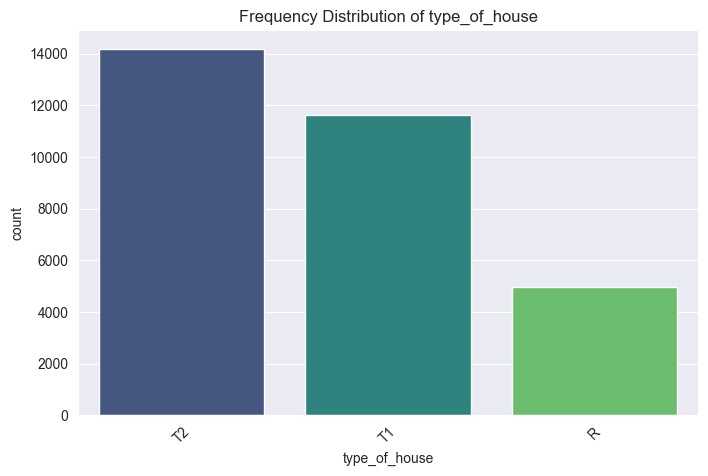

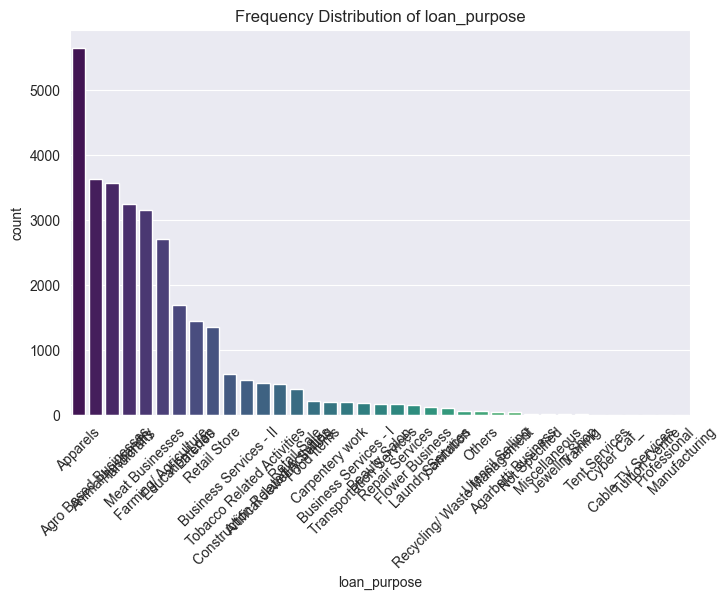

In [22]:
# Frequency distributions for categorical variables
for col in df.select_dtypes(include=['object']).columns:
    if df[col].nunique()<100: # Checking whether the plotting the distribution is useful
        plt.figure(figsize=(8, 5))
        sns.countplot(x=df[col], order=df[col].value_counts().index, palette='viridis')
        plt.xticks(rotation=45)
        plt.title(f"Frequency Distribution of {col}")
        plt.show()

In [23]:
# Skewness and kurtosis
for col in df.select_dtypes(include=[np.number]).columns:
    print(f"{col} - Skewness: {df[col].skew():.2f}, Kurtosis: {df[col].kurtosis():.2f}")

Id - Skewness: -0.41, Kurtosis: -0.92
age - Skewness: 0.29, Kurtosis: -0.41
annual_income - Skewness: 8.88, Kurtosis: 296.91
monthly_expenses - Skewness: 1.19, Kurtosis: 4.15
old_dependents - Skewness: 4.78, Kurtosis: 24.46
young_dependents - Skewness: 0.44, Kurtosis: -0.18
home_ownership - Skewness: -6.42, Kurtosis: 39.16
occupants_count - Skewness: 0.61, Kurtosis: 1.38
house_area - Skewness: 1.27, Kurtosis: 1.67
sanitary_availability - Skewness: -1.31, Kurtosis: -0.28
water_availability - Skewness: -0.30, Kurtosis: -1.59
loan_tenure - Skewness: 21.94, Kurtosis: 985.65
loan_installments - Skewness: 1.24, Kurtosis: -0.44
loan_amount - Skewness: 54.23, Kurtosis: 3817.98


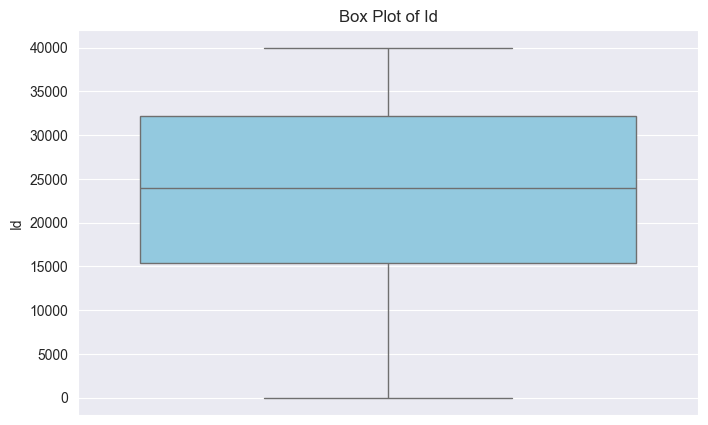

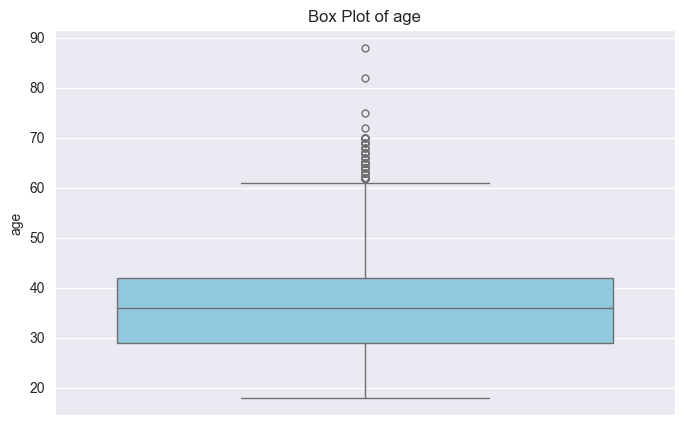

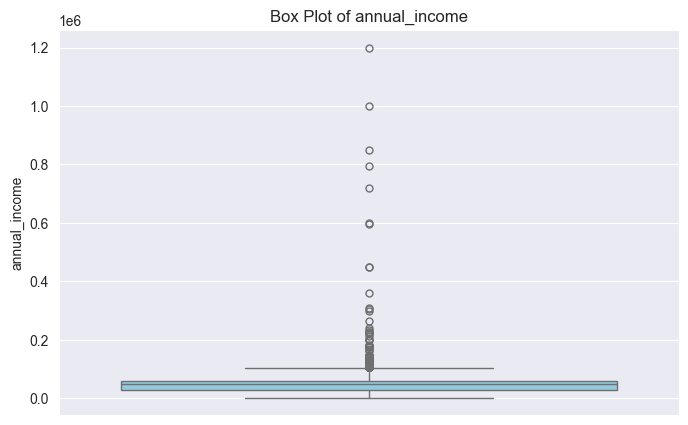

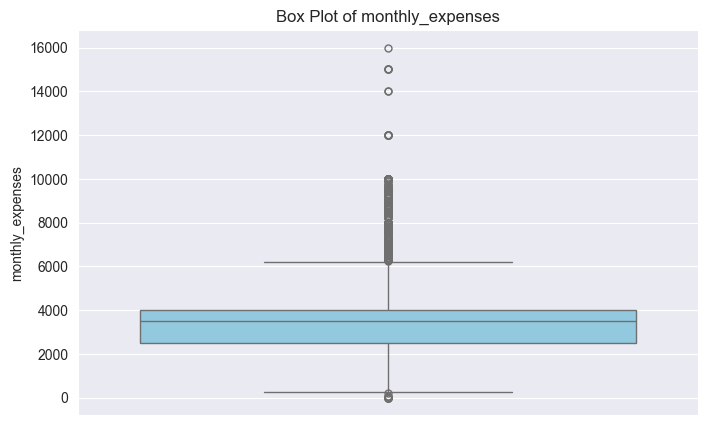

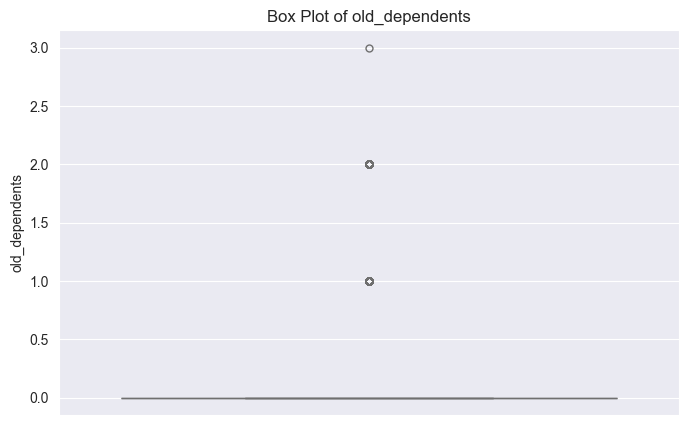

...

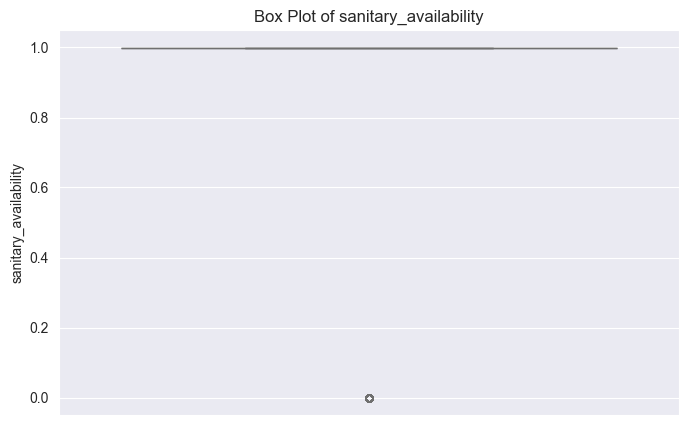

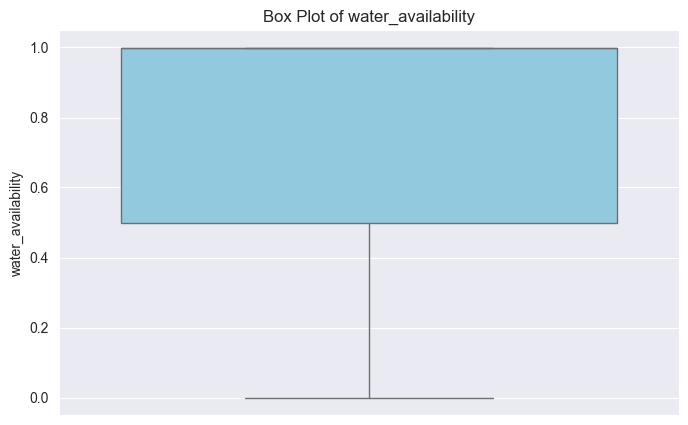

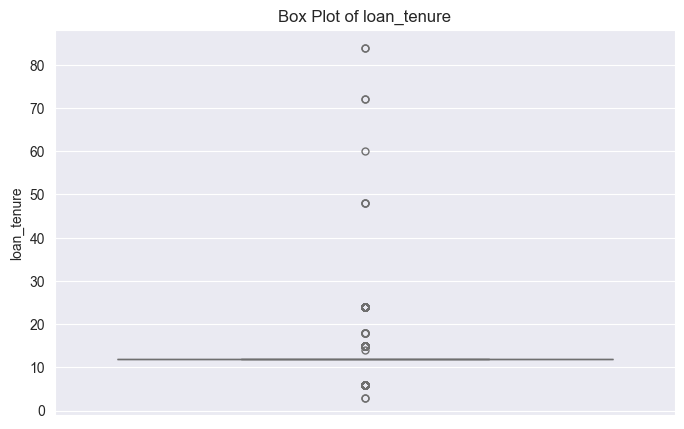

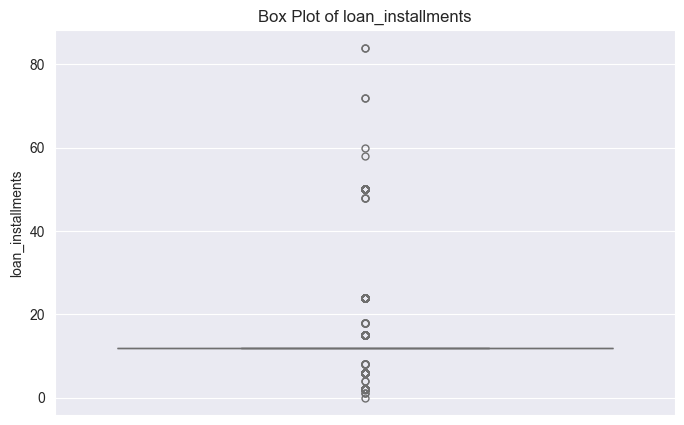

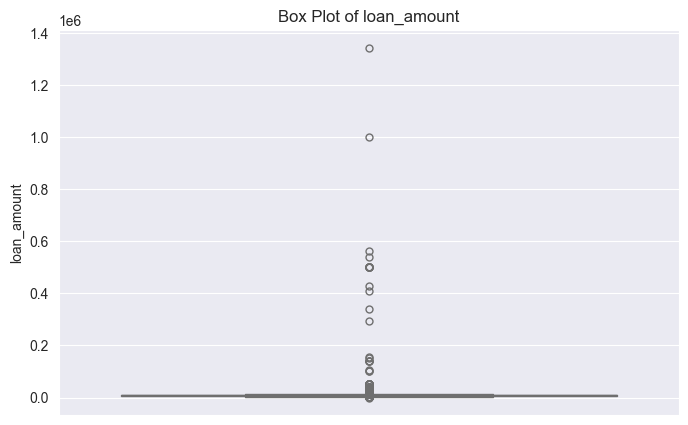

In [24]:
# Separate Box plots for each numerical variable
for col in df.select_dtypes(include=[np.number]).columns:
    if col in ['id','home_ownership']:
        continue
    plt.figure(figsize=(8, 5))
    sns.boxplot(y=df[col], color='skyblue', flierprops={'marker': 'o', 'color': 'red', 'markersize': 5})
    plt.title(f"Box Plot of {col}")
    plt.show()

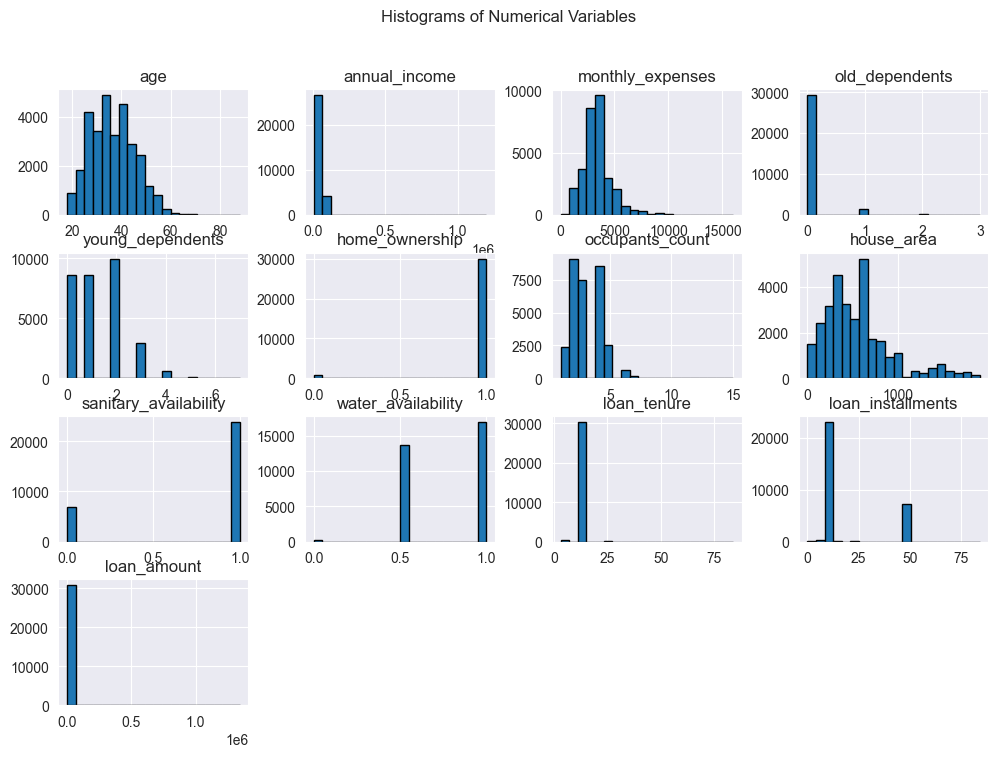

In [25]:
# Histograms for numerical variables
df.drop(columns=[col for col in df.columns if 'id' in col.lower()], errors='ignore').hist(figsize=(12, 8), bins=20, edgecolor='black')
plt.suptitle('Histograms of Numerical Variables')
plt.show()

# Bivariate Analysis #

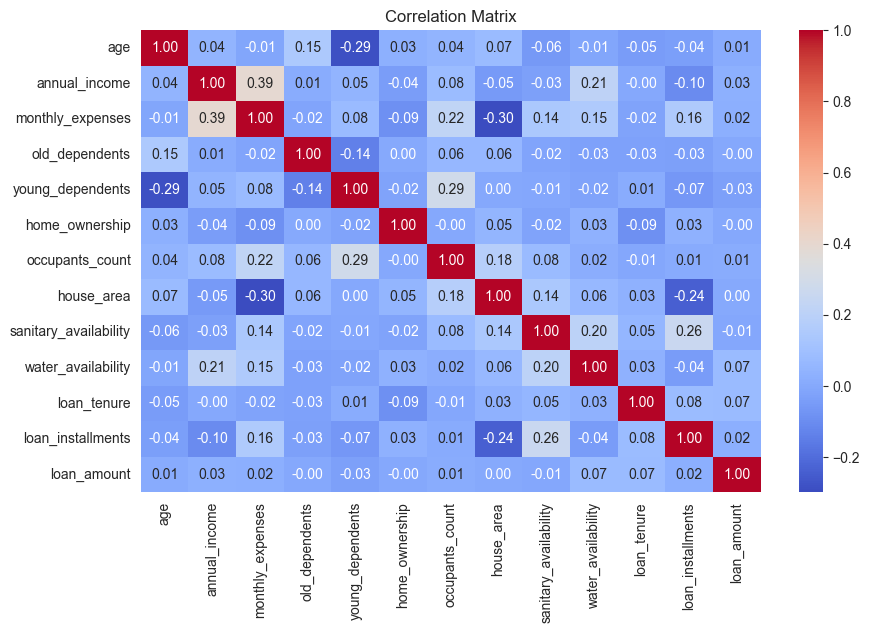

In [35]:
# Correlation Matrix
plt.figure(figsize=(10, 6))
sns.heatmap(df.select_dtypes(include=[np.number]).drop(columns=[col for col in df.select_dtypes(include=[np.number]).columns if 'id' in col.lower()], errors='ignore').corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.show()

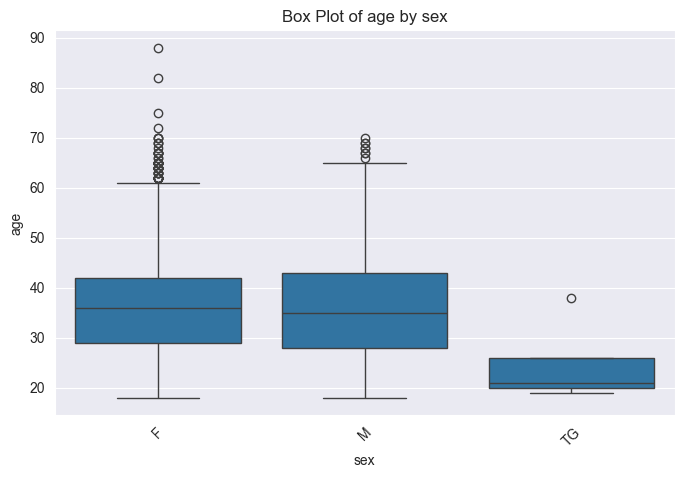

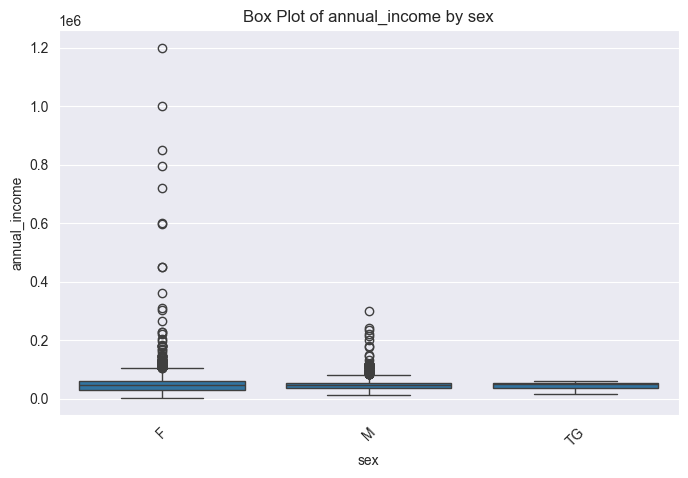

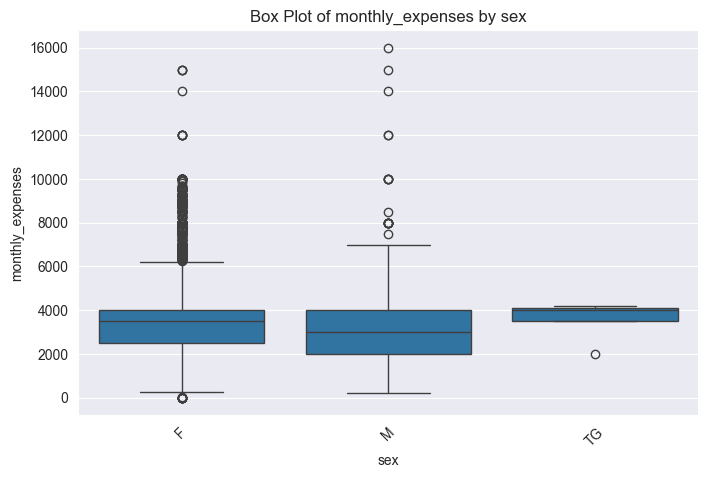

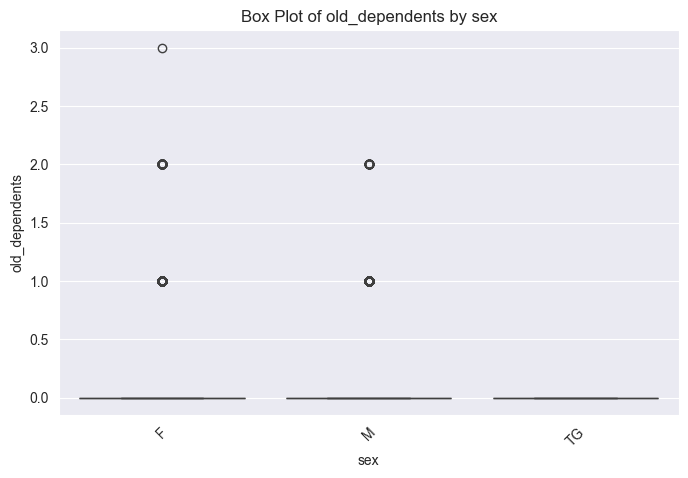

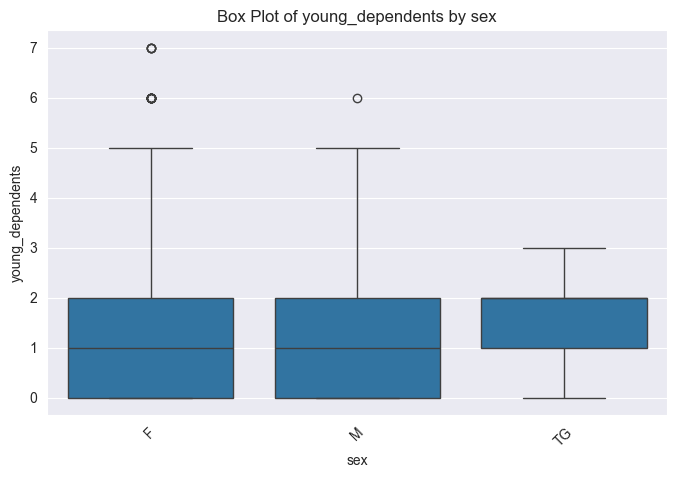

...

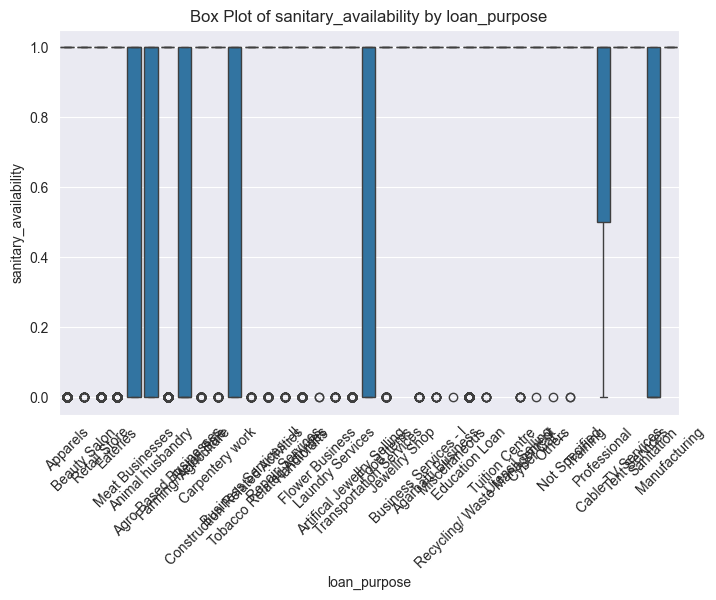

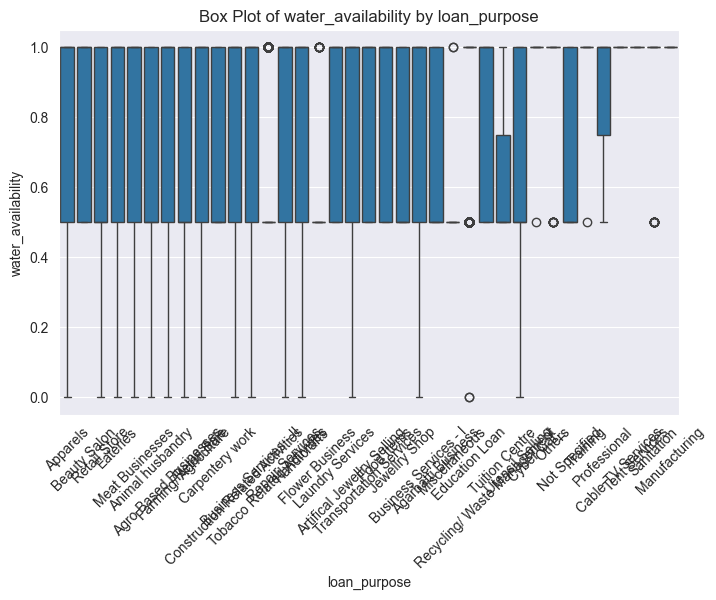

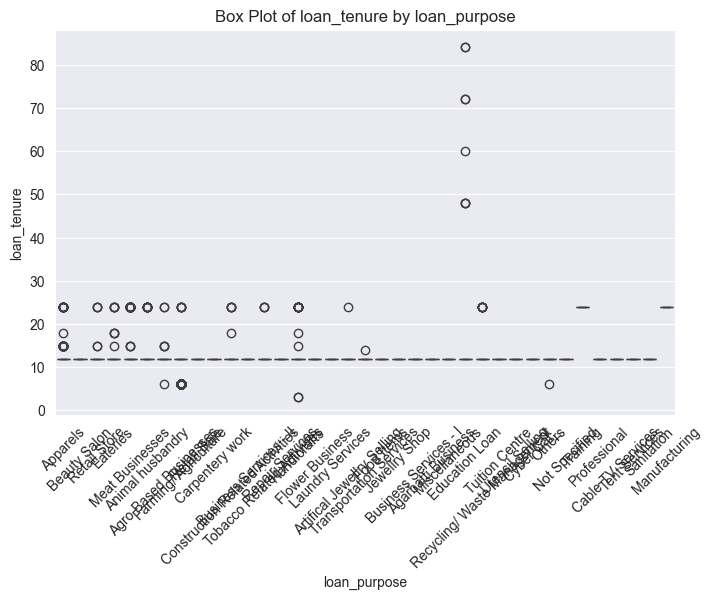

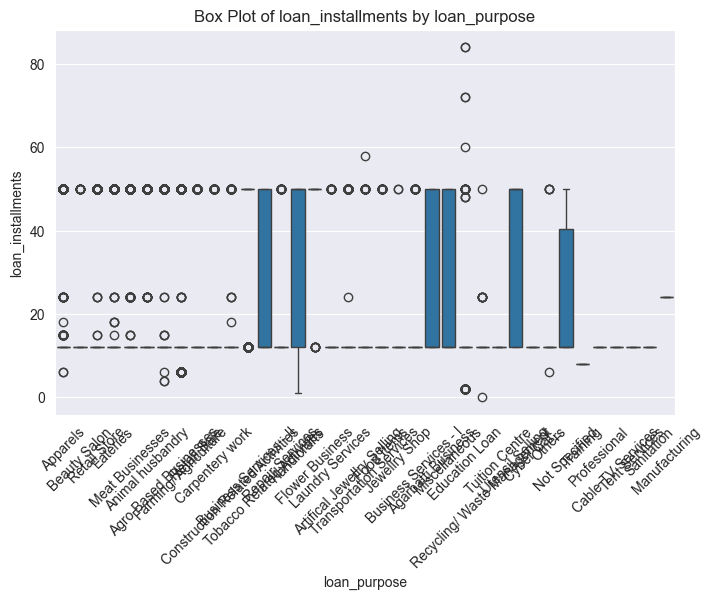

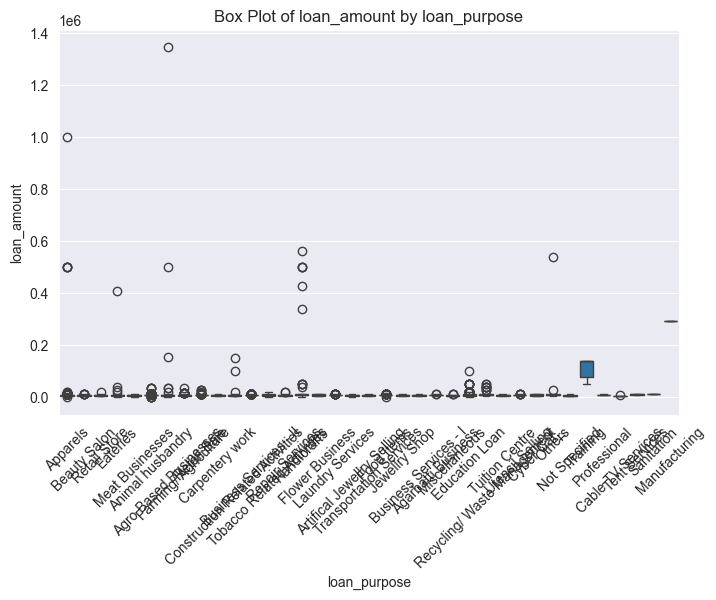

In [39]:
# Box plot of a numerical variable against a categorical variable
for col in [c for c in df.select_dtypes(include=['object']).columns if df[c].nunique() < 100]:
    for num_col in df.select_dtypes(include=[np.number]).columns:
        if 'id' in num_col.lower():
            continue
        plt.figure(figsize=(8, 5))
        sns.boxplot(x=df[col], y=df[num_col], data=df)
        plt.xticks(rotation=45)
        plt.title(f"Box Plot of {num_col} by {col}")
        plt.show()

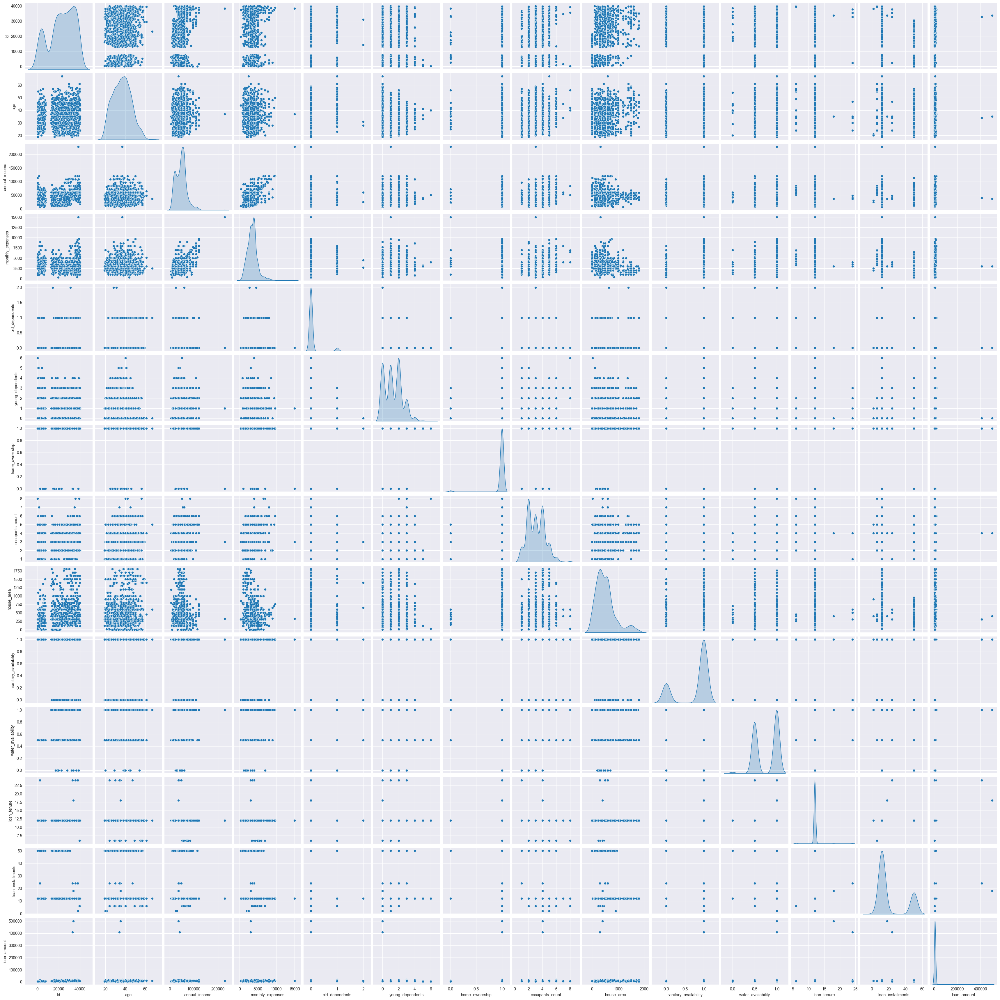

In [40]:
# Scatter plots for selected numerical variables
sns.pairplot(df.sample(n=min(1000, len(df))), diag_kind='kde')
plt.show()

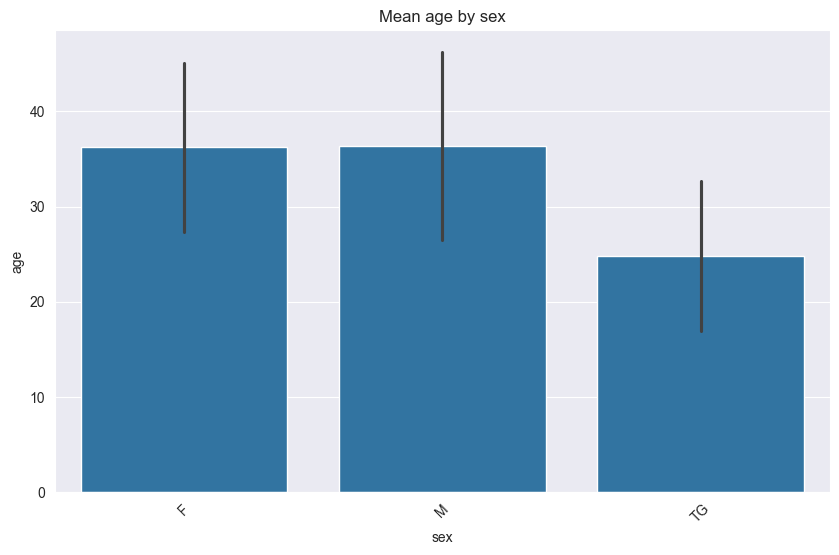

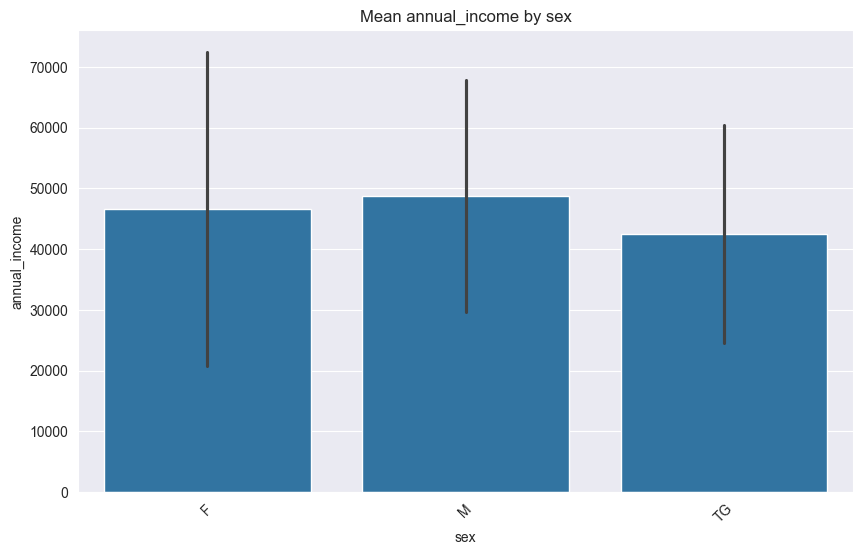

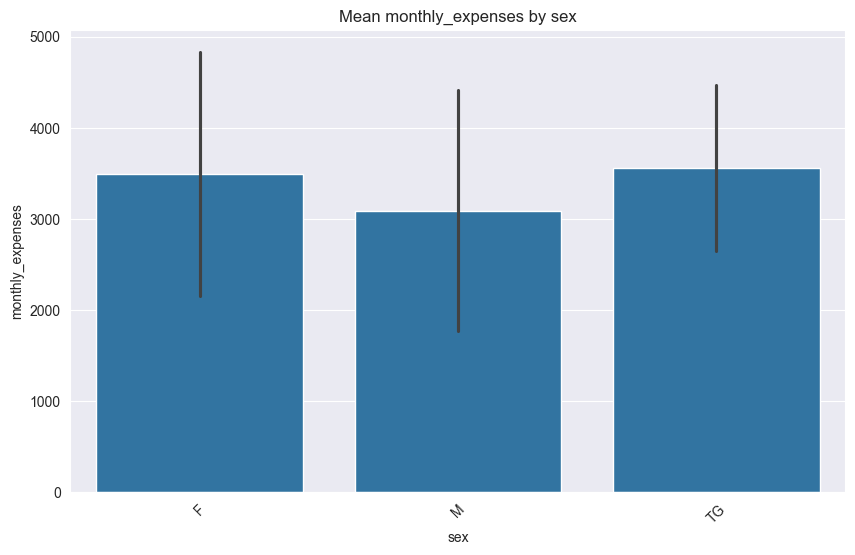

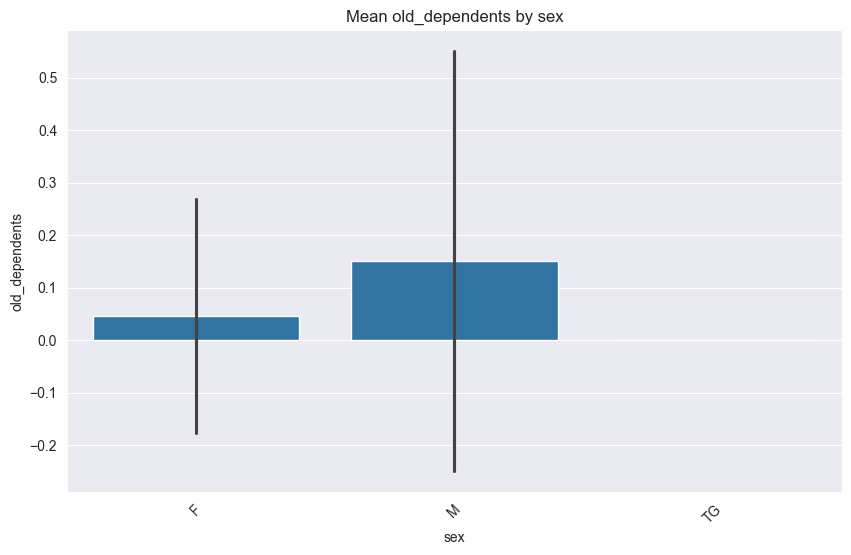

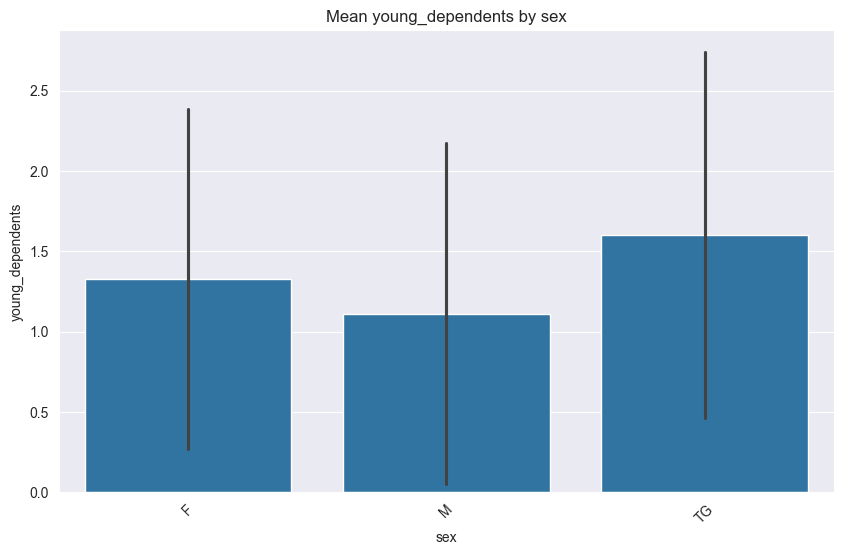

...

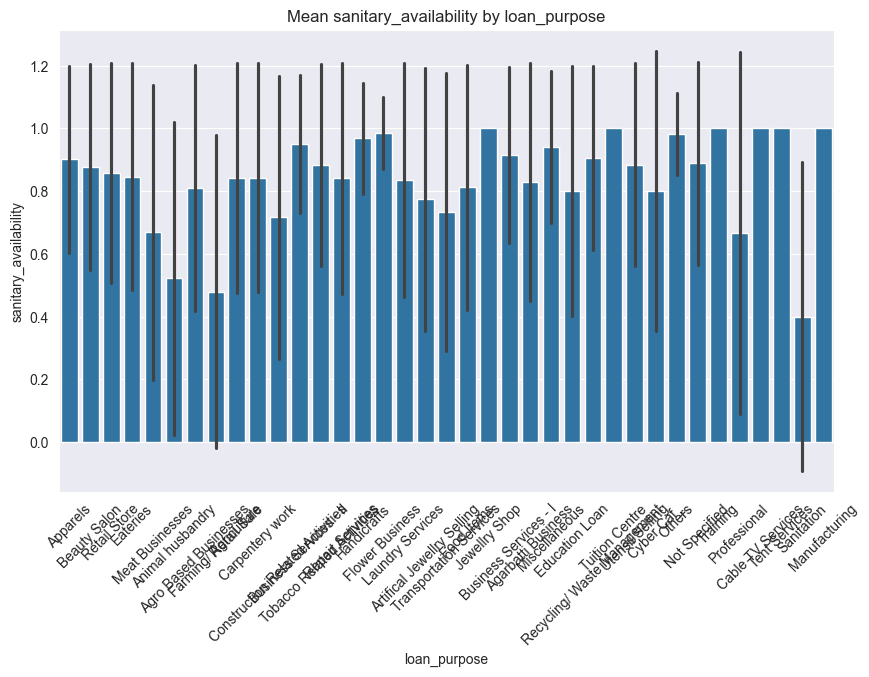

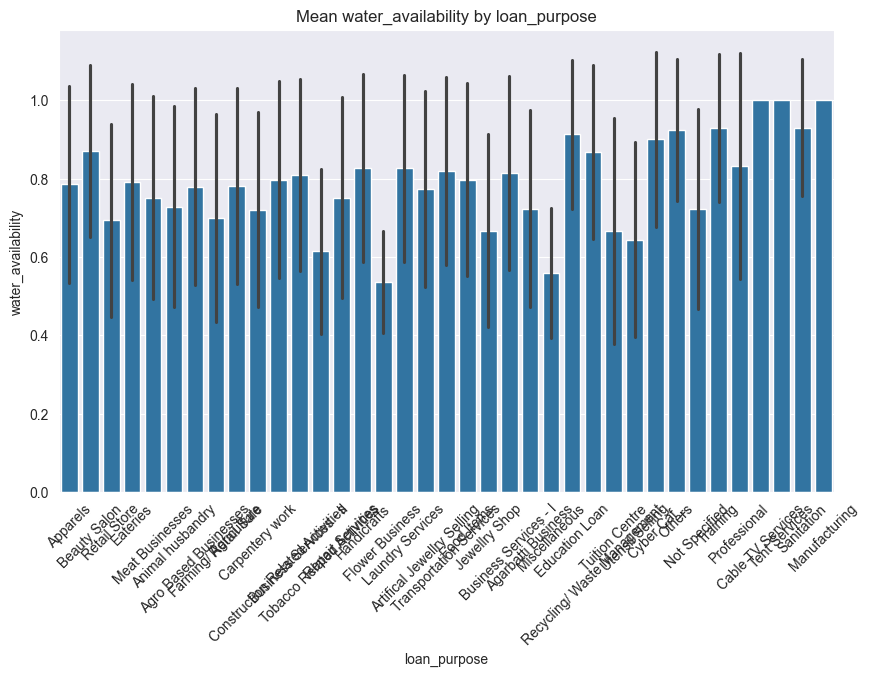

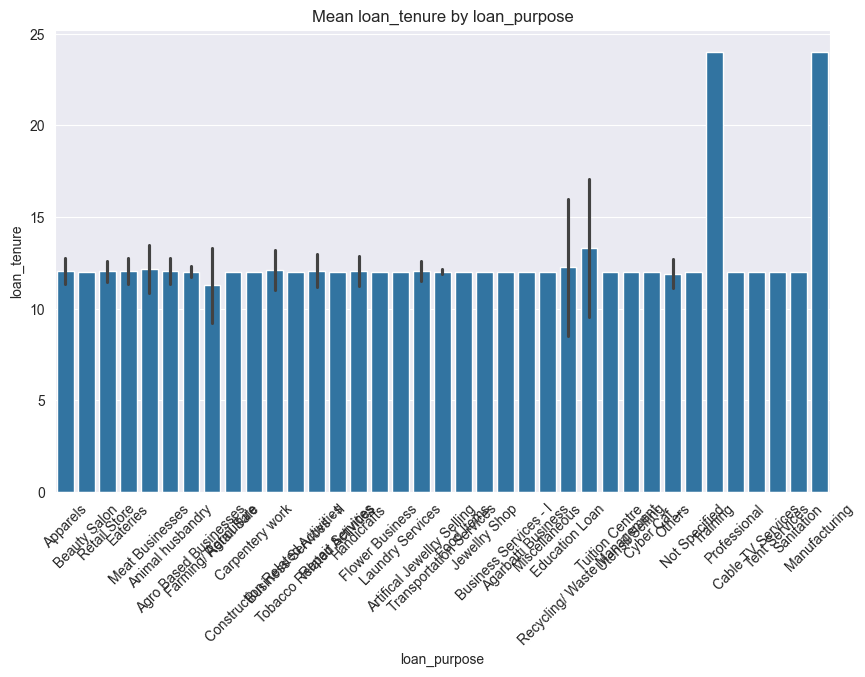

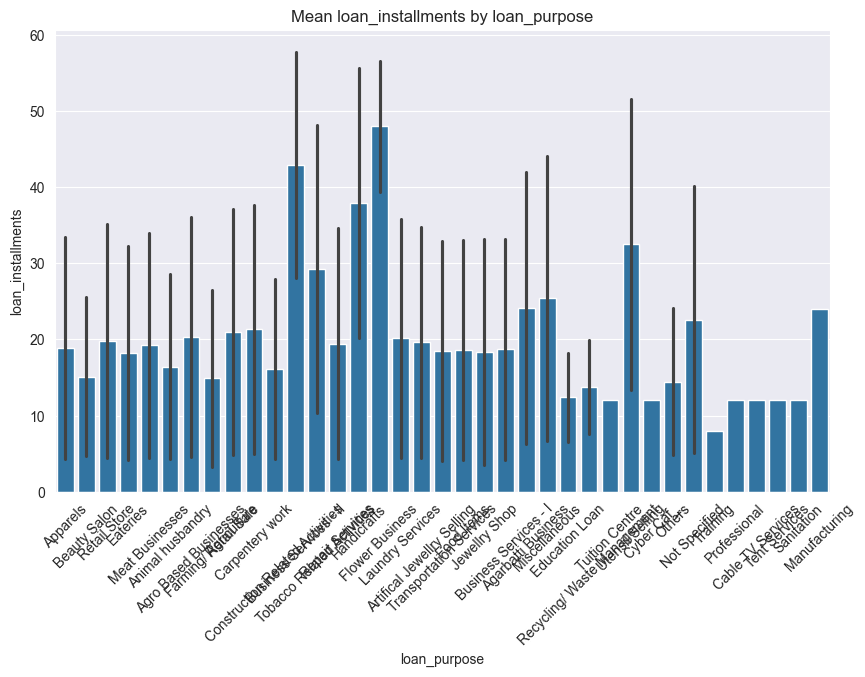

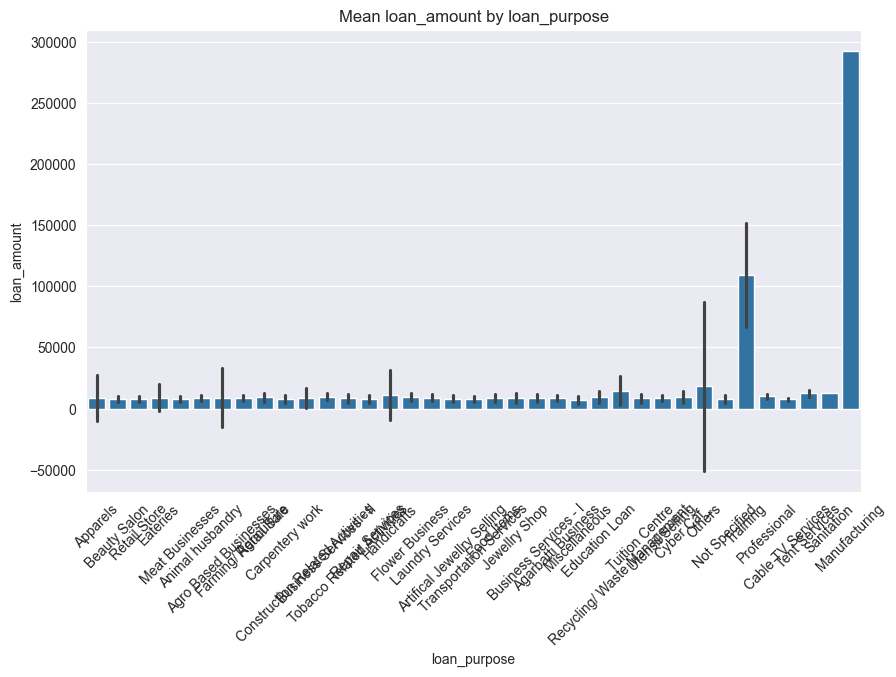

In [41]:

# Bar plots for categorical vs numerical relationships
for col in [c for c in df.select_dtypes(include=['object']).columns if df[c].nunique() < 100]:
    for num_col in df.select_dtypes(include=[np.number]).columns:
        if 'id' in num_col.lower():
            continue
        plt.figure(figsize=(10, 6))
        sns.barplot(x=df[col], y=df[num_col], data=df, estimator=np.mean, ci='sd')
        plt.xticks(rotation=45)
        plt.title(f"Mean {num_col} by {col}")
        plt.show()

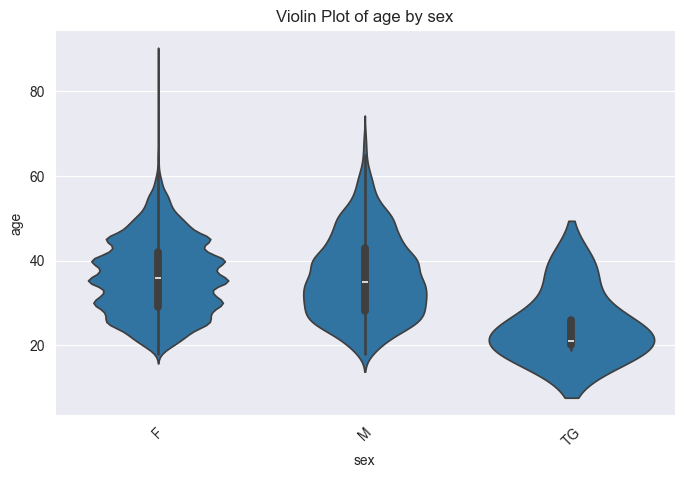

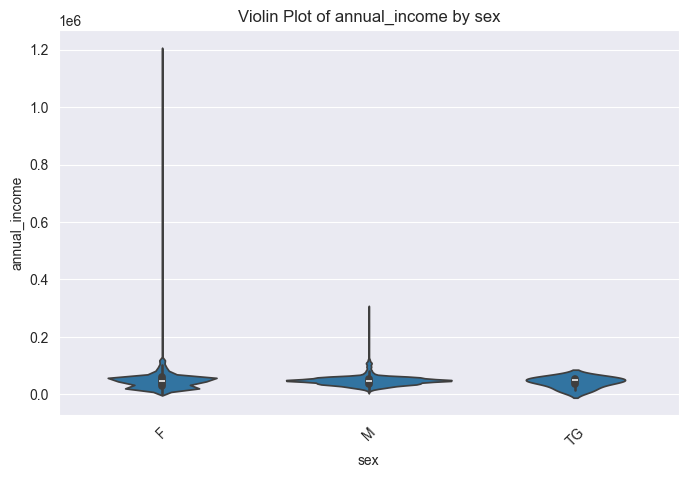

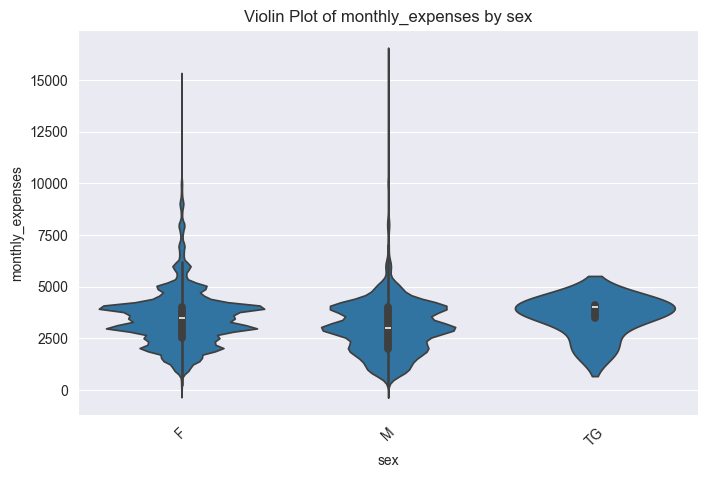

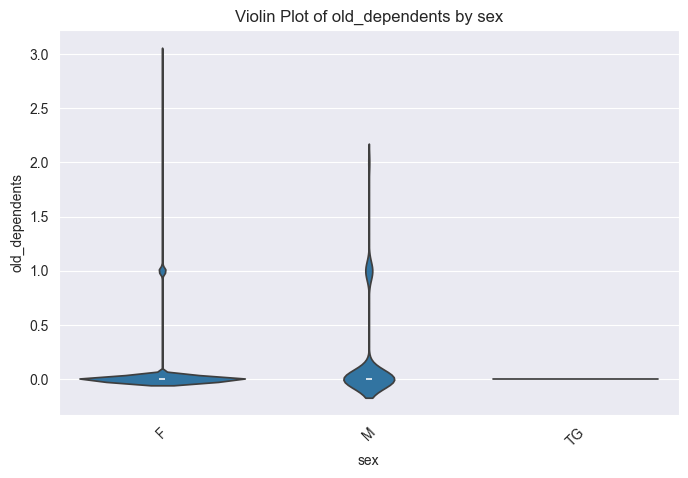

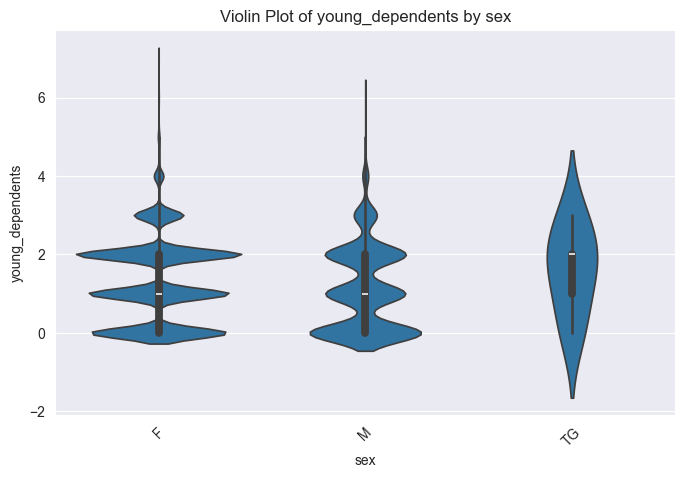

...

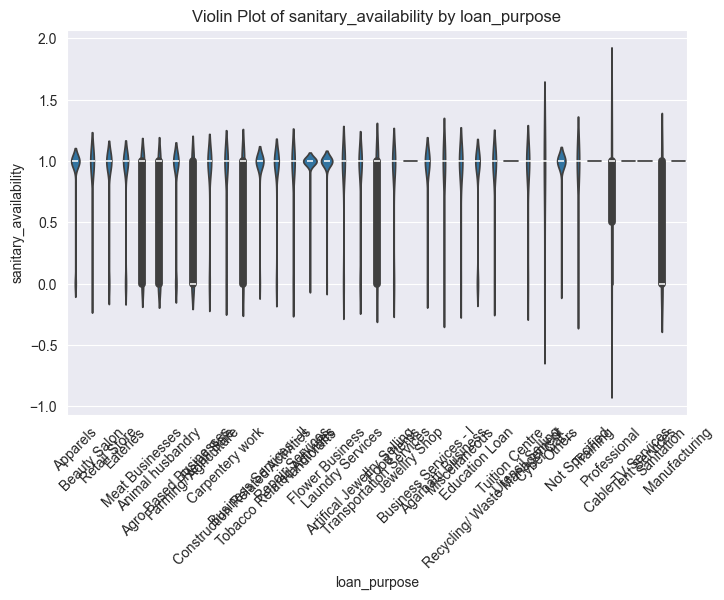

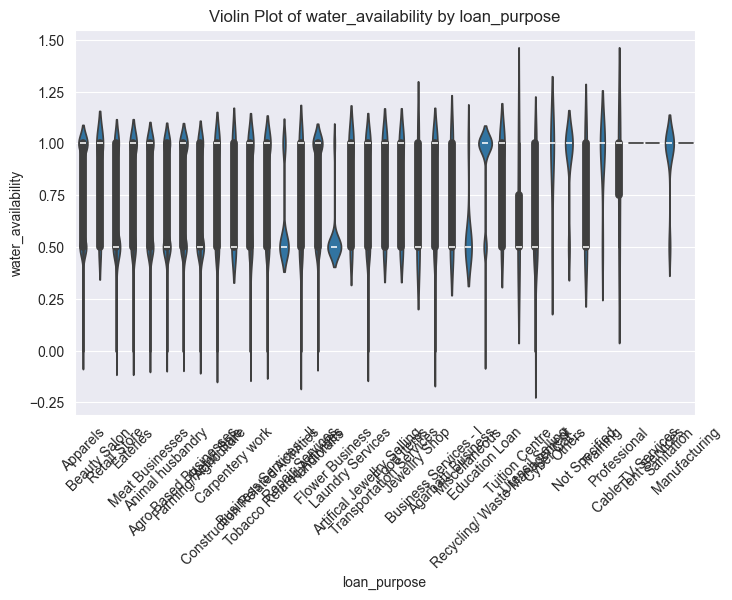

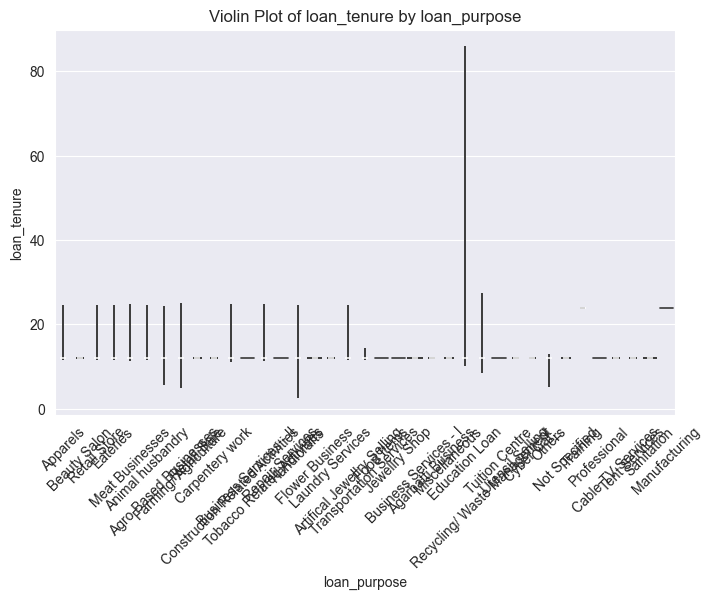

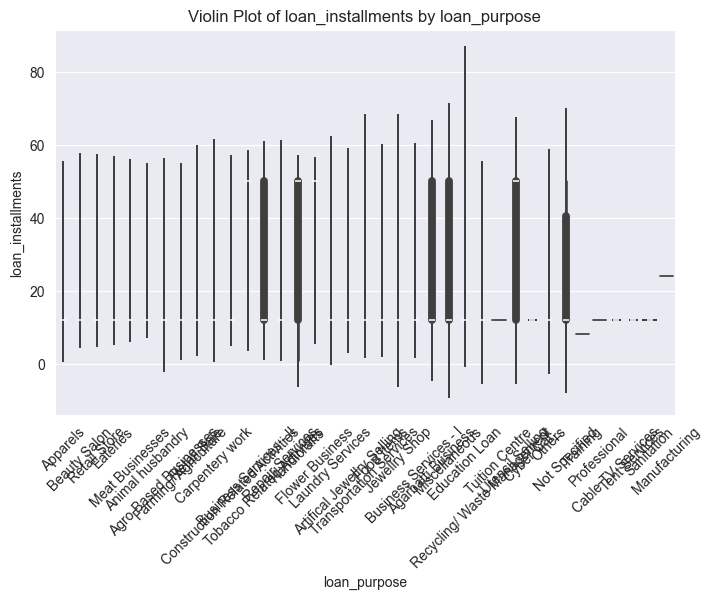

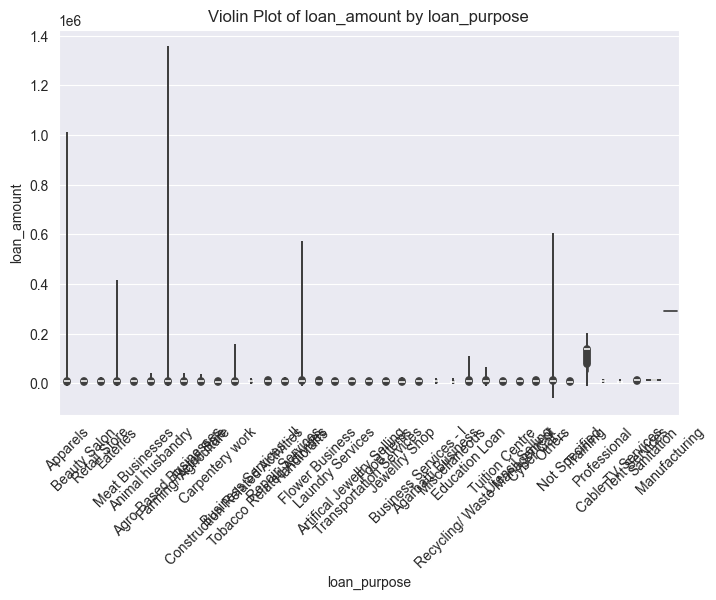

In [42]:
# Violin plots to visualize numerical distributions across categories
for col in [c for c in df.select_dtypes(include=['object']).columns if df[c].nunique() < 100]:
    for num_col in df.select_dtypes(include=[np.number]).columns:
        if 'id' in num_col.lower():
            continue
        plt.figure(figsize=(8, 5))
        sns.violinplot(x=df[col], y=df[num_col], data=df)
        plt.xticks(rotation=45)
        plt.title(f"Violin Plot of {num_col} by {col}")
        plt.show()


# Multivariate Analysis #

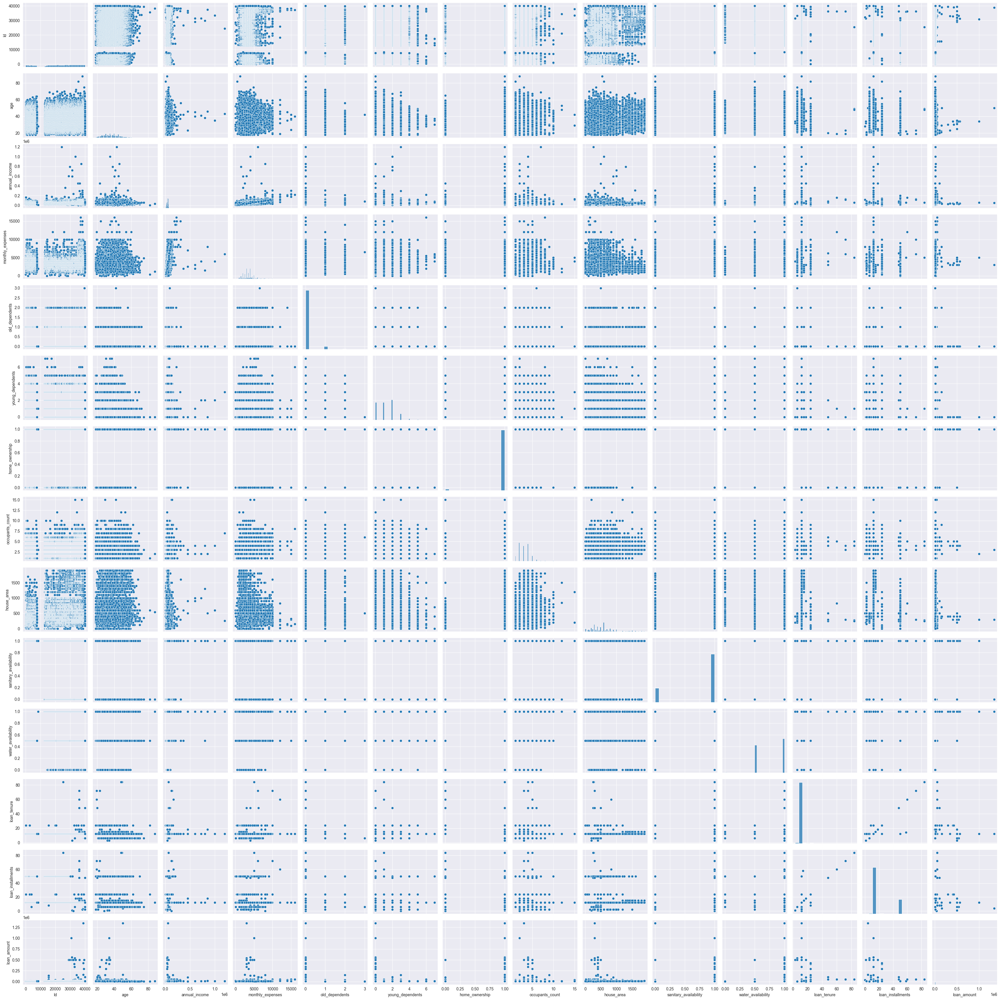

In [43]:
# Pair plot for multiple numerical variables
sns.pairplot(df)
plt.show()

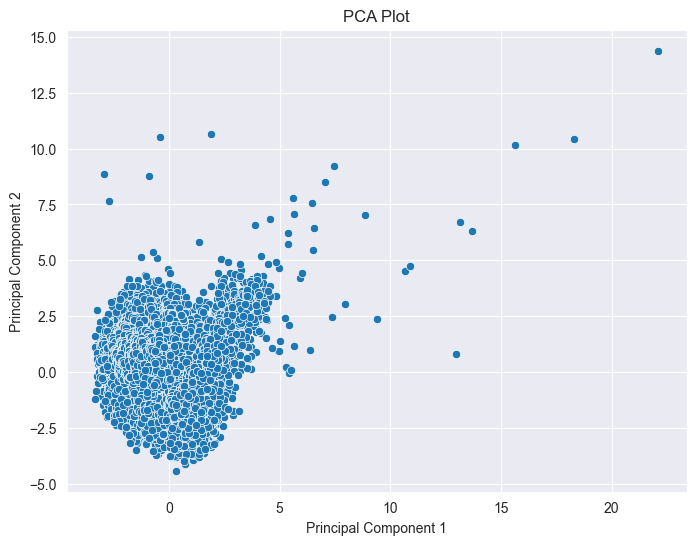

In [48]:

# Principal Component Analysis (PCA)
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

numerical_cols = df.select_dtypes(include=[np.number]).columns
scaled_data = StandardScaler().fit_transform(df[numerical_cols])
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)
df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]

plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['PCA1'], y=df['PCA2'])
plt.title("PCA Plot")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

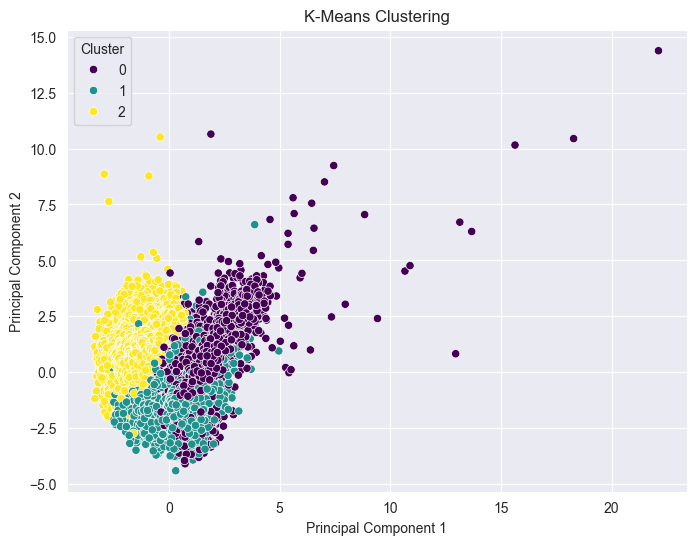

In [49]:
# Clustering using K-Means
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(scaled_data)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['PCA1'], y=df['PCA2'], hue=df['Cluster'], palette='viridis')
plt.title("K-Means Clustering")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.show()
